In [1]:
# Step 0: Install and import
# Install required libraries (quiet mode so it doesn't spam output)
!pip install torch torchvision matplotlib --quiet

# Import core PyTorch library
import torch
import torch.nn as nn # For neural network layers
import torch.optim as optim # For optimization algorithms (Adam, SGD, etc.)

# Import torchvision for datasets and image transformations
from torchvision import datasets, transforms
from torch.utils.data import DataLoader # To load data in batches
import torchvision.utils as vutils # To visualize images as grids

# Import matplotlib and numpy for plotting and array operations
import matplotlib.pyplot as plt
import numpy as np

# Select GPU if available, otherwise CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)


Using device: cpu


In [2]:
#Step 1: Load Fashion MNIST
# Define transformations for the images:
# 1) Convert to tensor
# 2) Normalize pixel values to range [-1, 1]
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # mean=0.5, std=0.5
])

# Download and load the Fashion-MNIST training dataset
train_data = datasets.FashionMNIST(
    root='./data', # directory to store data
    train=True, # load training split
    download=True, # download if not already present
    transform=transform # apply the transformations defined above
    )

# Create a DataLoader to iterate through dataset in batches
dataloader = DataLoader(
    train_data,
    batch_size=64, # number of images per batch
    shuffle=True # shuffle dataset each epoch
    )


In [3]:
#Step 2: Define Generator & Discriminator

# Image size for Fashion-MNIST is 28x28 = 784 flattened
img_dim = 28*28
# Size of the input noise vector for generator
z_dim = 100

# Generator network:
# Takes random noise (z_dim) and outputs a flattened image (img_dim)
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256), # input noise -> hidden layer
            nn.ReLU(True), # activation
            nn.Linear(256, 512), # hidden layer
            nn.ReLU(True),
            nn.Linear(512, img_dim), # output layer
            nn.Tanh() # scale output to [-1, 1]
        )
    def forward(self, z):
        out = self.net(z)
        return out.view(-1, 1, 28, 28)

# The Discriminator is a neural network that takes a flattened image
# and outputs a single value between 0 and 1, representing how "real" it thinks the image is.
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(img_dim, 512), # input: flattened image -> hidden layer
            nn.LeakyReLU(0.2), # activation with slope for negative values
            nn.Linear(512, 256), # hidden layer
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1), # output layer (single value)
            nn.Sigmoid() # output between 0 and 1
        )

    def forward(self, img):
      # Flatten the image into a vector before feeding it to the network
        flat = img.view(img.size(0), -1)
        return self.net(flat)




In [4]:
#Step 3: Initialize models, loss, optimizers
# Create instances of the Generator and Discriminator, and move them to GPU if available
gen = Generator().to(device)
disc = Discriminator().to(device)

# Define the loss function (Binary Cross Entropy)
# Measures how well the discriminator distinguishes real from fake
criterion = nn.BCELoss()

# Define optimizers for both Generator and Discriminator
# Adam optimizer is commonly used for GANs
opt_gen = optim.Adam(gen.parameters(), lr=0.0001)
opt_disc = optim.Adam(disc.parameters(), lr=0.0002)

# Create some fixed random noise to visualize progress after each epoch
fixed_noise = torch.randn(16, z_dim).to(device)

# Number of training epochs
epochs = 200



Epoch [1/200] Loss D: 0.0040, Loss G: 7.6087


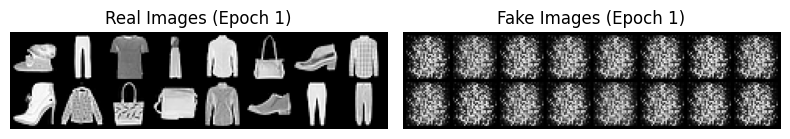

Epoch [2/200] Loss D: 0.0313, Loss G: 6.8143


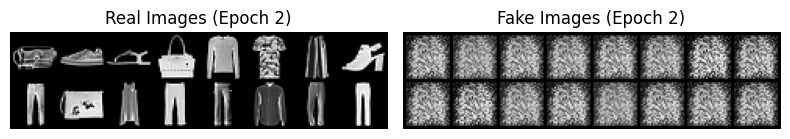

Epoch [3/200] Loss D: 0.0155, Loss G: 4.6698


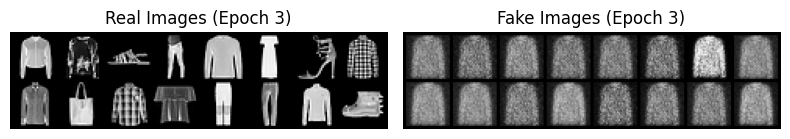

Epoch [4/200] Loss D: 0.0129, Loss G: 8.0192


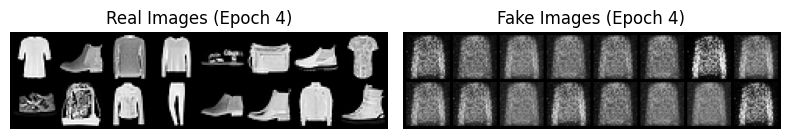

Epoch [5/200] Loss D: 0.0232, Loss G: 5.3269


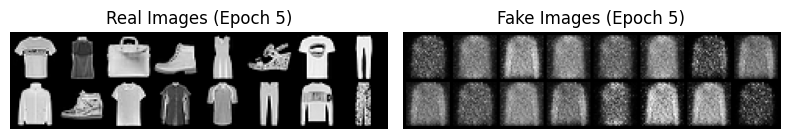

Epoch [6/200] Loss D: 0.0586, Loss G: 4.1694


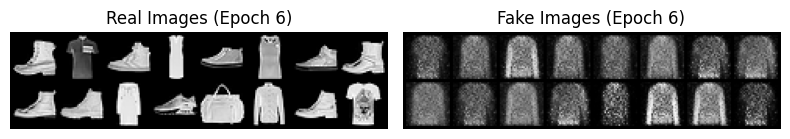

Epoch [7/200] Loss D: 0.0516, Loss G: 5.8281


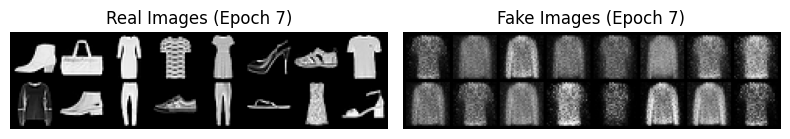

Epoch [8/200] Loss D: 0.1836, Loss G: 4.1271


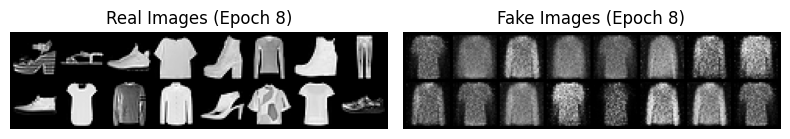

Epoch [9/200] Loss D: 0.1192, Loss G: 5.6405


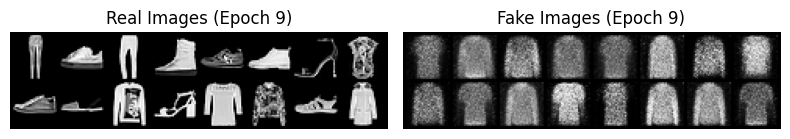

Epoch [10/200] Loss D: 0.1265, Loss G: 3.5944


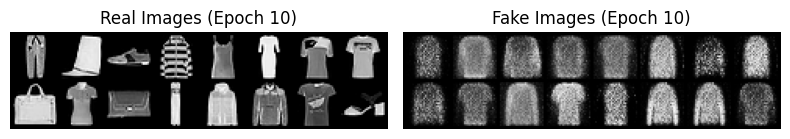

Epoch [11/200] Loss D: 0.0426, Loss G: 4.6477


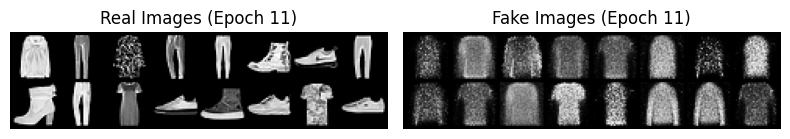

Epoch [12/200] Loss D: 0.0834, Loss G: 4.1692


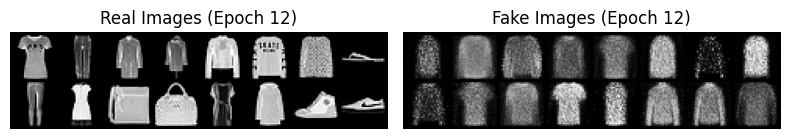

Epoch [13/200] Loss D: 0.1714, Loss G: 4.4299


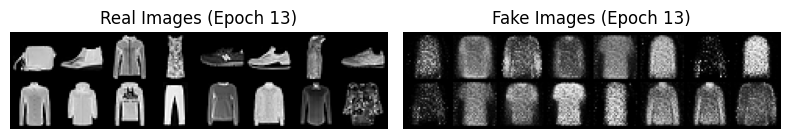

Epoch [14/200] Loss D: 0.0928, Loss G: 6.1446


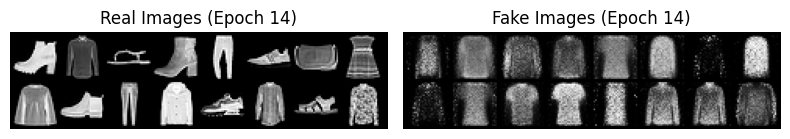

Epoch [15/200] Loss D: 0.0871, Loss G: 5.6874


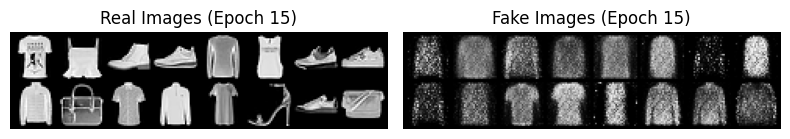

Epoch [16/200] Loss D: 0.0865, Loss G: 4.1778


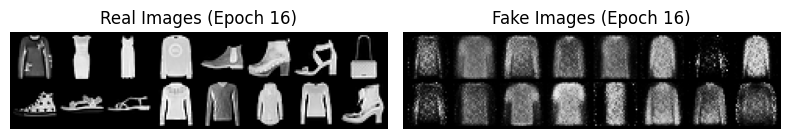

Epoch [17/200] Loss D: 0.0775, Loss G: 4.0298


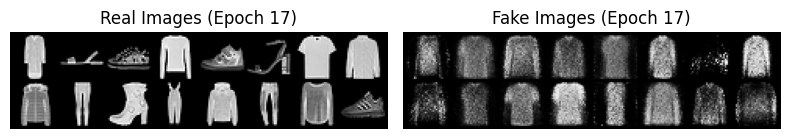

Epoch [18/200] Loss D: 0.1698, Loss G: 3.1780


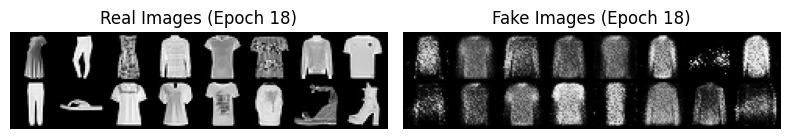

Epoch [19/200] Loss D: 0.2815, Loss G: 3.3446


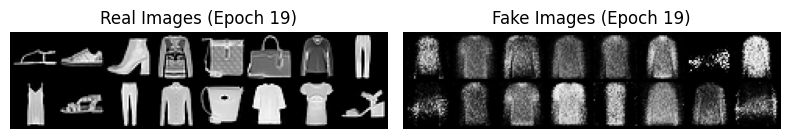

Epoch [20/200] Loss D: 0.1133, Loss G: 4.5901


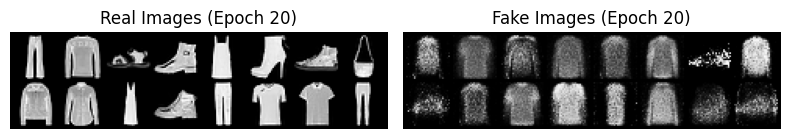

Epoch [21/200] Loss D: 0.2658, Loss G: 3.0762


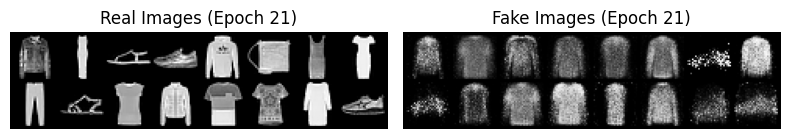

Epoch [22/200] Loss D: 0.4171, Loss G: 3.1396


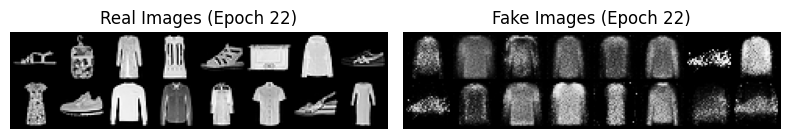

Epoch [23/200] Loss D: 0.1804, Loss G: 3.8812


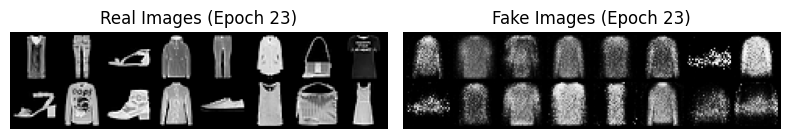

Epoch [24/200] Loss D: 0.1359, Loss G: 3.1541


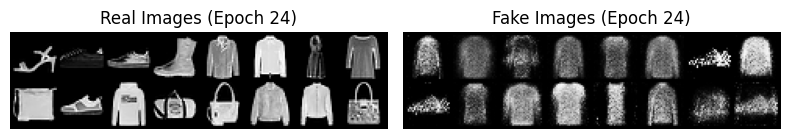

Epoch [25/200] Loss D: 0.2591, Loss G: 2.6480


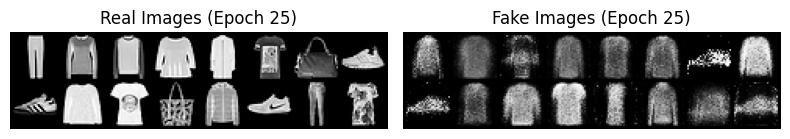

Epoch [26/200] Loss D: 0.0932, Loss G: 5.1067


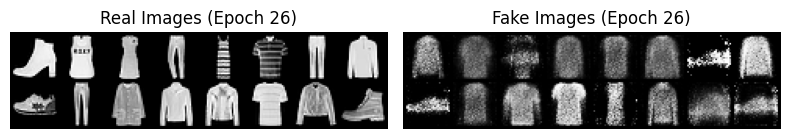

Epoch [27/200] Loss D: 0.1456, Loss G: 3.1874


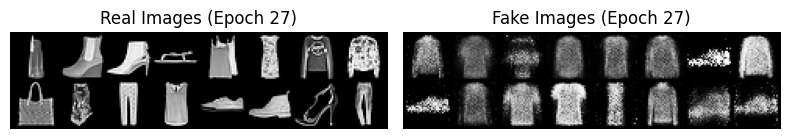

Epoch [28/200] Loss D: 0.1337, Loss G: 3.5091


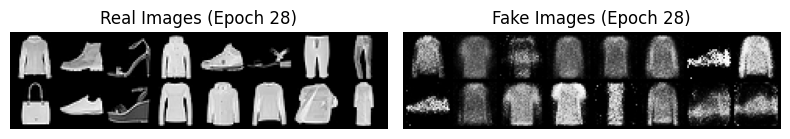

Epoch [29/200] Loss D: 0.3911, Loss G: 3.4375


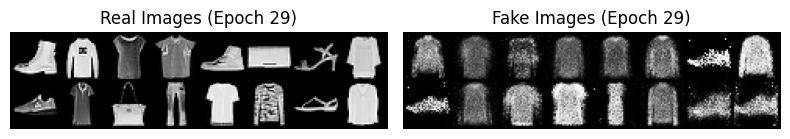

Epoch [30/200] Loss D: 0.1915, Loss G: 3.5171


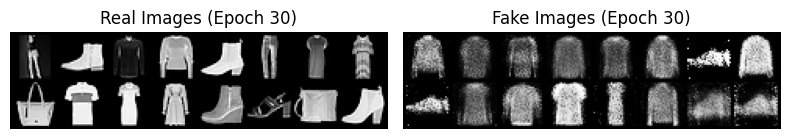

Epoch [31/200] Loss D: 0.3738, Loss G: 5.0519


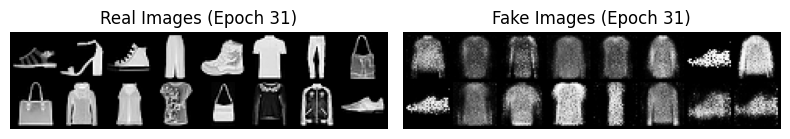

Epoch [32/200] Loss D: 0.2071, Loss G: 3.0387


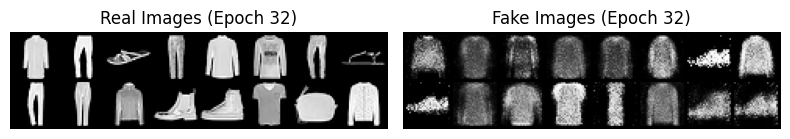

Epoch [33/200] Loss D: 0.1328, Loss G: 4.0193


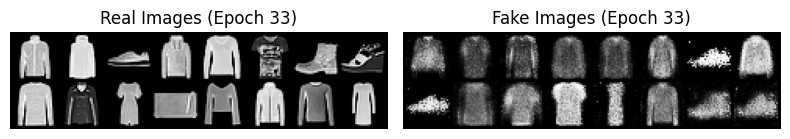

Epoch [34/200] Loss D: 0.1437, Loss G: 3.9153


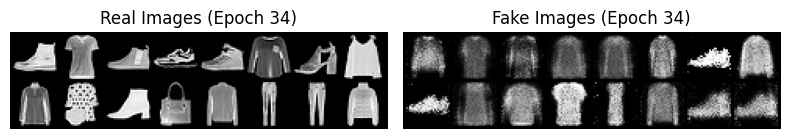

Epoch [35/200] Loss D: 0.3504, Loss G: 3.3312


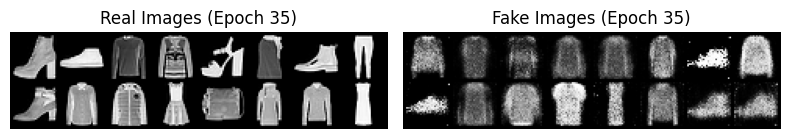

Epoch [36/200] Loss D: 0.4398, Loss G: 3.4506


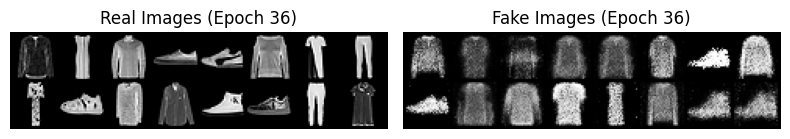

Epoch [37/200] Loss D: 0.2013, Loss G: 3.0443


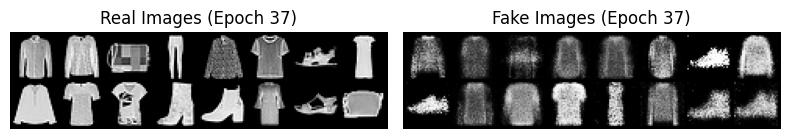

Epoch [38/200] Loss D: 0.2458, Loss G: 2.8639


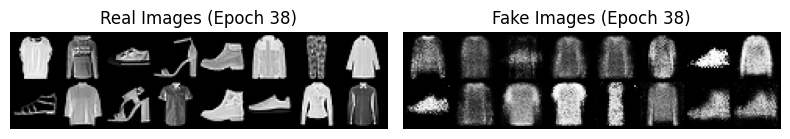

Epoch [39/200] Loss D: 0.1469, Loss G: 2.9255


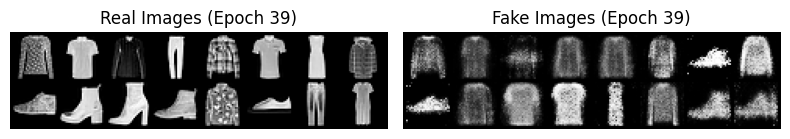

Epoch [40/200] Loss D: 0.4344, Loss G: 2.6331


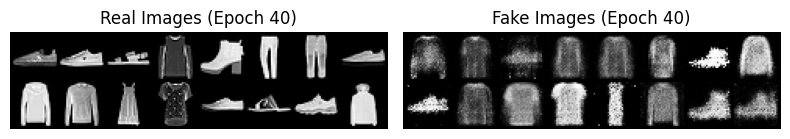

Epoch [41/200] Loss D: 0.2601, Loss G: 3.1053


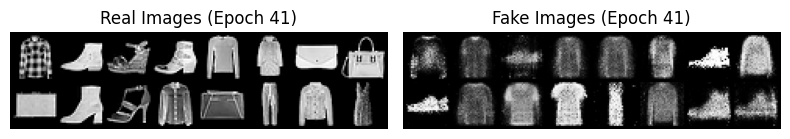

Epoch [42/200] Loss D: 0.1995, Loss G: 2.4952


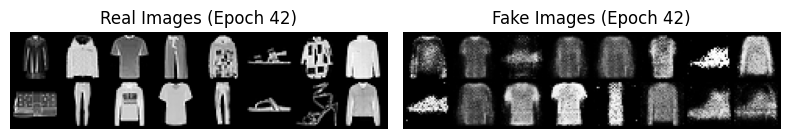

Epoch [43/200] Loss D: 0.2289, Loss G: 3.3710


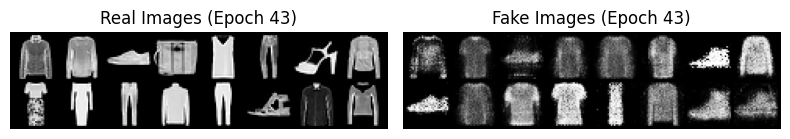

Epoch [44/200] Loss D: 0.3707, Loss G: 1.7341


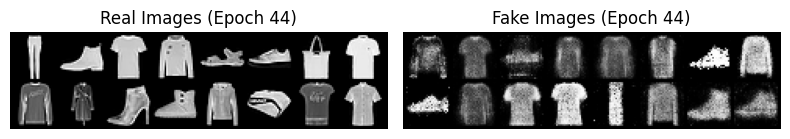

Epoch [45/200] Loss D: 0.1484, Loss G: 2.8239


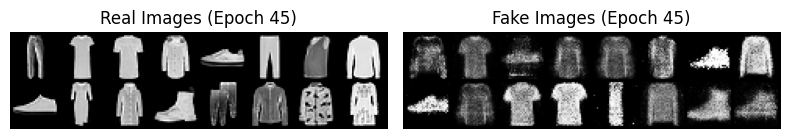

Epoch [46/200] Loss D: 0.1785, Loss G: 2.4783


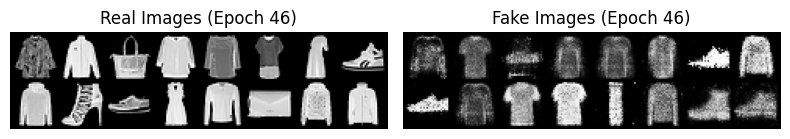

Epoch [47/200] Loss D: 0.3217, Loss G: 3.0954


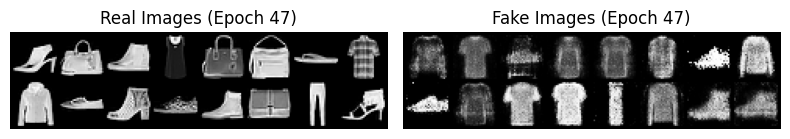

Epoch [48/200] Loss D: 0.2559, Loss G: 2.7681


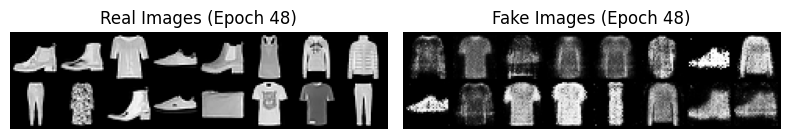

Epoch [49/200] Loss D: 0.1919, Loss G: 4.0135


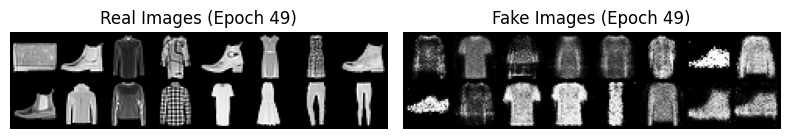

Epoch [50/200] Loss D: 0.4049, Loss G: 3.6965


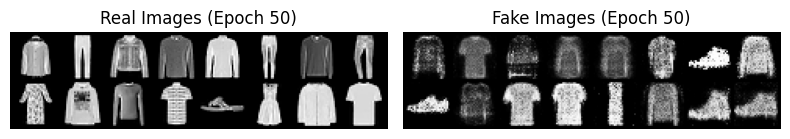

Epoch [51/200] Loss D: 0.2332, Loss G: 2.8970


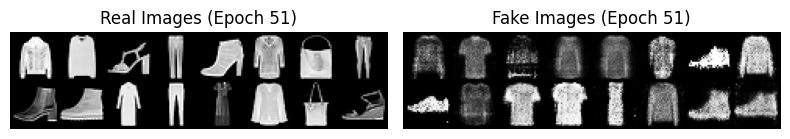

Epoch [52/200] Loss D: 0.1875, Loss G: 3.5386


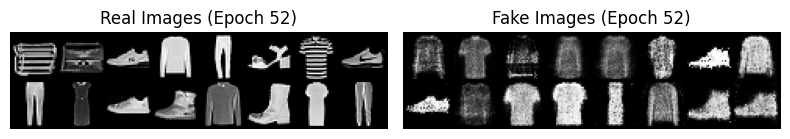

Epoch [53/200] Loss D: 0.1639, Loss G: 2.7732


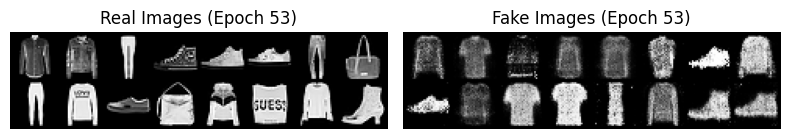

Epoch [54/200] Loss D: 0.2533, Loss G: 3.0474


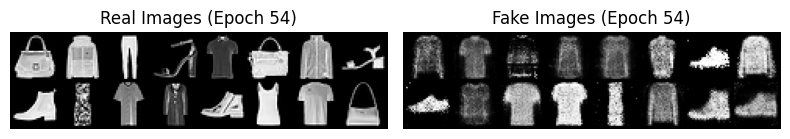

Epoch [55/200] Loss D: 0.1987, Loss G: 2.8003


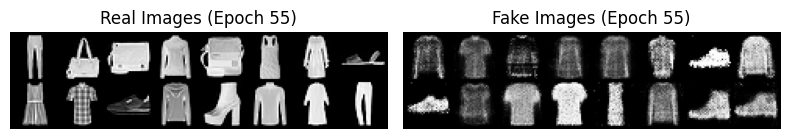

Epoch [56/200] Loss D: 0.6595, Loss G: 1.9567


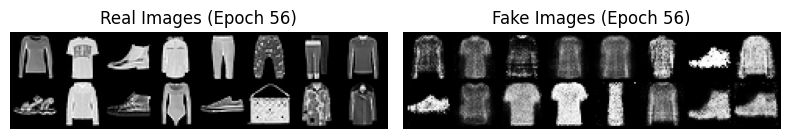

Epoch [57/200] Loss D: 0.2678, Loss G: 4.3714


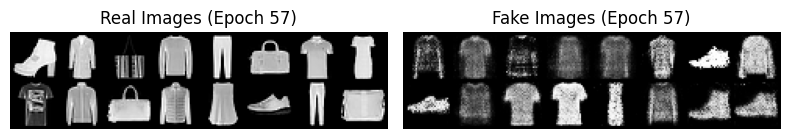

Epoch [58/200] Loss D: 0.2529, Loss G: 2.8346


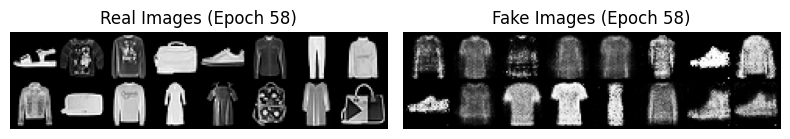

Epoch [59/200] Loss D: 0.3400, Loss G: 2.3869


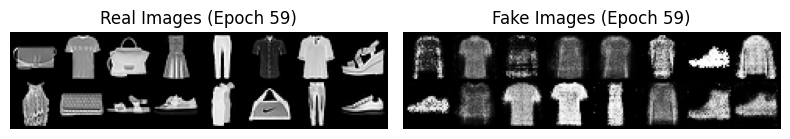

Epoch [60/200] Loss D: 0.4647, Loss G: 2.4955


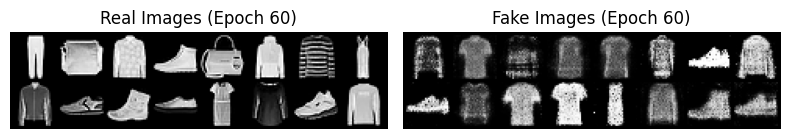

Epoch [61/200] Loss D: 0.3640, Loss G: 1.9922


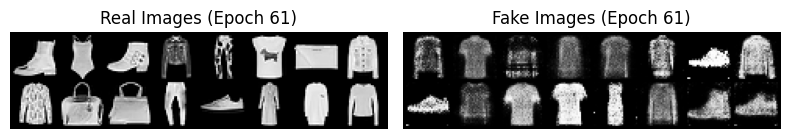

Epoch [62/200] Loss D: 0.4085, Loss G: 3.0242


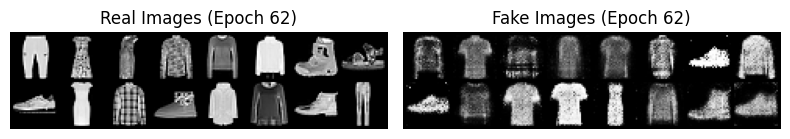

Epoch [63/200] Loss D: 0.4801, Loss G: 2.2365


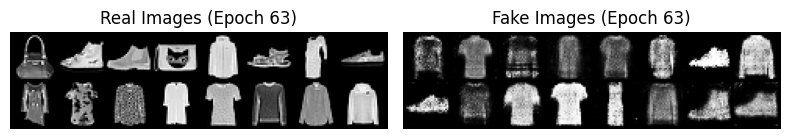

Epoch [64/200] Loss D: 0.3180, Loss G: 2.4480


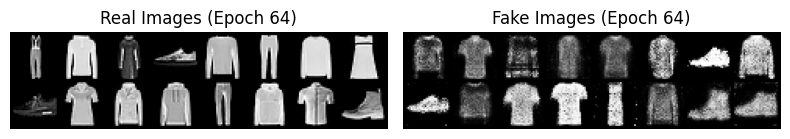

Epoch [65/200] Loss D: 0.4048, Loss G: 1.8173


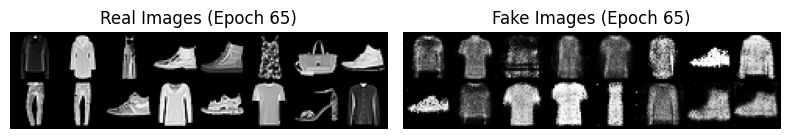

Epoch [66/200] Loss D: 0.3448, Loss G: 3.1138


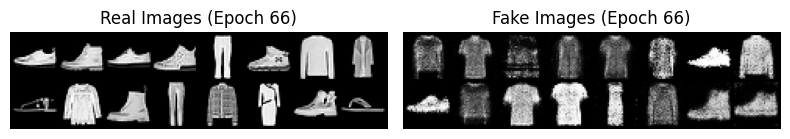

Epoch [67/200] Loss D: 0.2465, Loss G: 2.4513


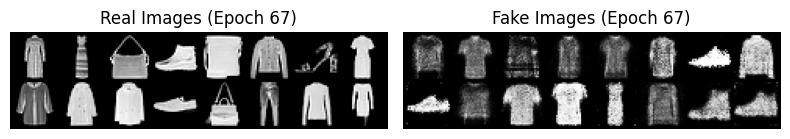

Epoch [68/200] Loss D: 0.3653, Loss G: 1.4922


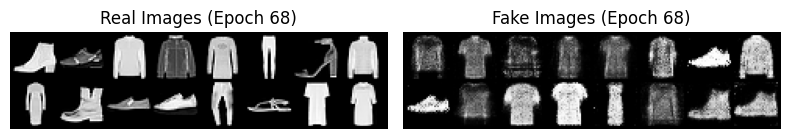

Epoch [69/200] Loss D: 0.4387, Loss G: 2.0573


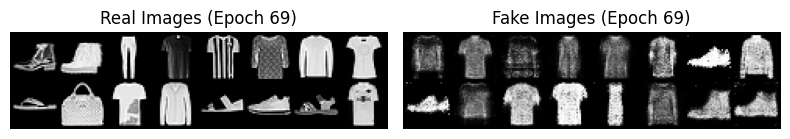

Epoch [70/200] Loss D: 0.2537, Loss G: 2.6101


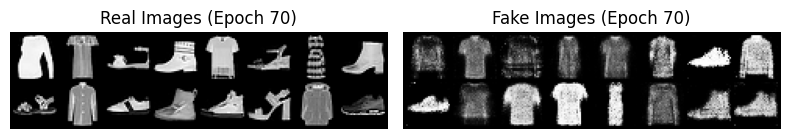

Epoch [71/200] Loss D: 0.4355, Loss G: 2.4660


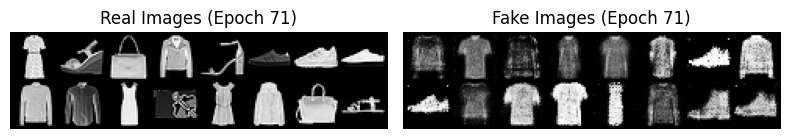

Epoch [72/200] Loss D: 0.4186, Loss G: 1.9885


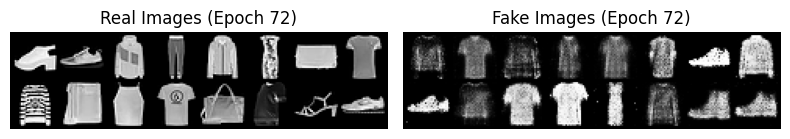

Epoch [73/200] Loss D: 0.4022, Loss G: 2.5037


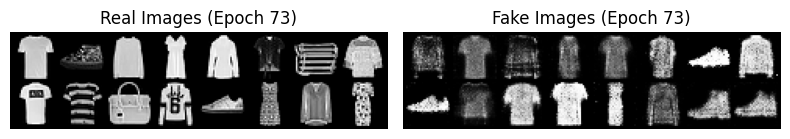

Epoch [74/200] Loss D: 0.3027, Loss G: 2.4075


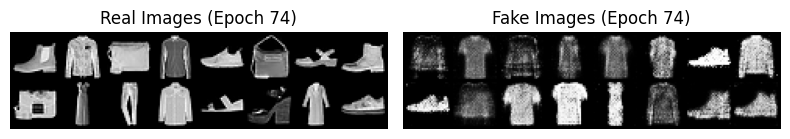

Epoch [75/200] Loss D: 0.3642, Loss G: 2.3789


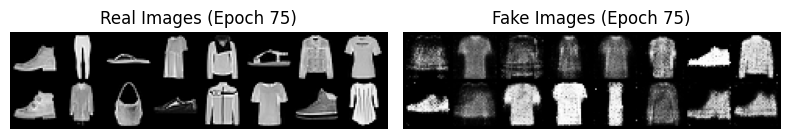

Epoch [76/200] Loss D: 0.4291, Loss G: 1.4677


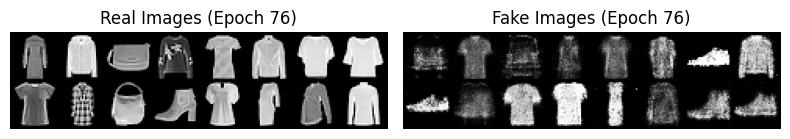

Epoch [77/200] Loss D: 0.3746, Loss G: 2.2960


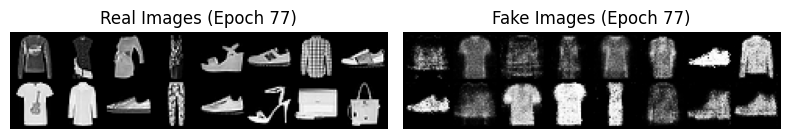

Epoch [78/200] Loss D: 0.3669, Loss G: 1.9123


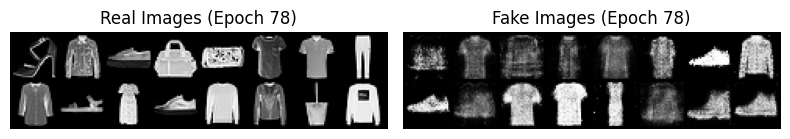

Epoch [79/200] Loss D: 0.4445, Loss G: 2.5973


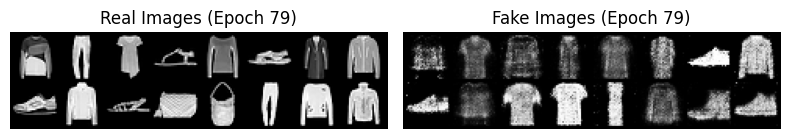

Epoch [80/200] Loss D: 0.3637, Loss G: 1.6445


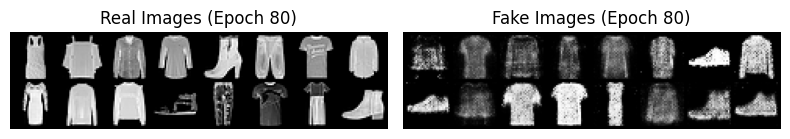

Epoch [81/200] Loss D: 0.3654, Loss G: 2.0529


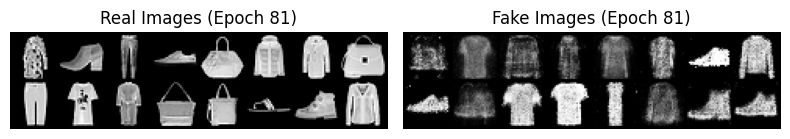

Epoch [82/200] Loss D: 0.4692, Loss G: 2.1458


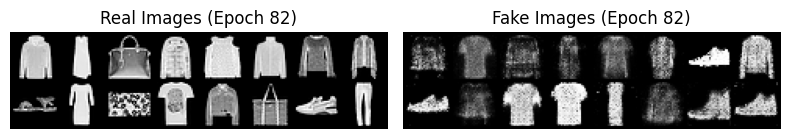

Epoch [83/200] Loss D: 0.3949, Loss G: 2.2787


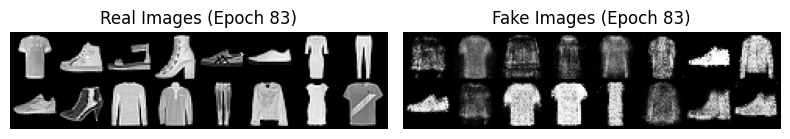

Epoch [84/200] Loss D: 0.3801, Loss G: 2.4092


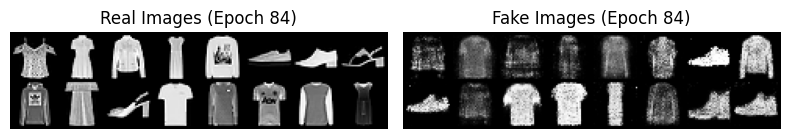

Epoch [85/200] Loss D: 0.2415, Loss G: 2.3657


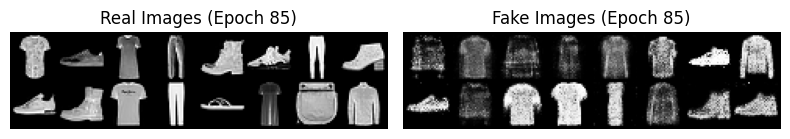

Epoch [86/200] Loss D: 0.3833, Loss G: 1.9077


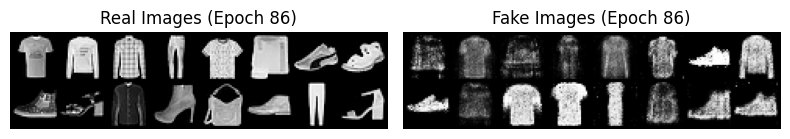

Epoch [87/200] Loss D: 0.3560, Loss G: 1.9626


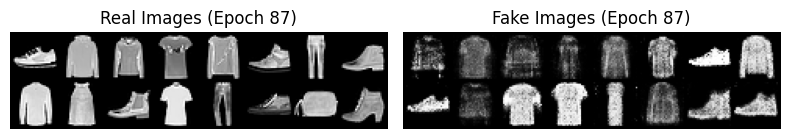

Epoch [88/200] Loss D: 0.3824, Loss G: 2.1455


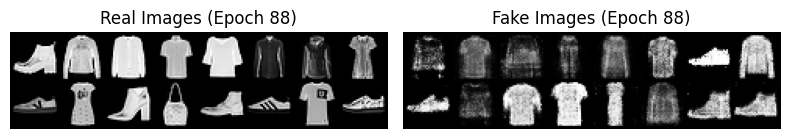

Epoch [89/200] Loss D: 0.2958, Loss G: 2.1986


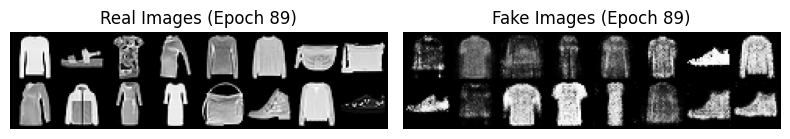

Epoch [90/200] Loss D: 0.4217, Loss G: 2.7487


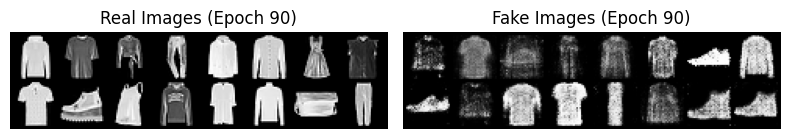

Epoch [91/200] Loss D: 0.6516, Loss G: 2.1700


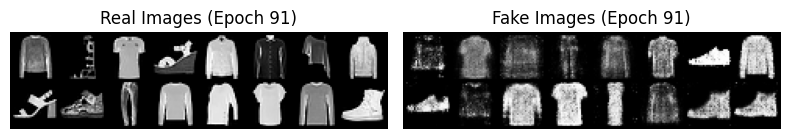

Epoch [92/200] Loss D: 0.3823, Loss G: 1.8344


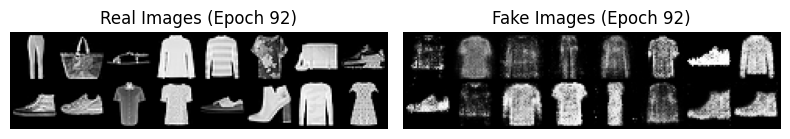

Epoch [93/200] Loss D: 0.3337, Loss G: 1.9170


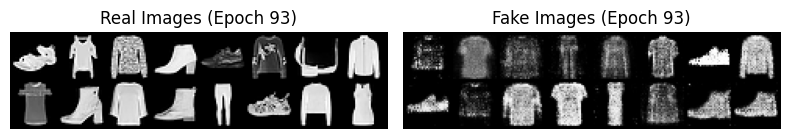

Epoch [94/200] Loss D: 0.4005, Loss G: 1.7687


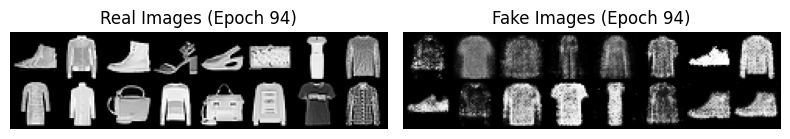

Epoch [95/200] Loss D: 0.2545, Loss G: 2.8706


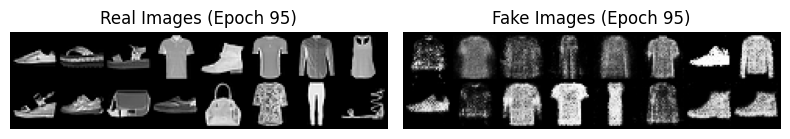

Epoch [96/200] Loss D: 0.4834, Loss G: 1.9650


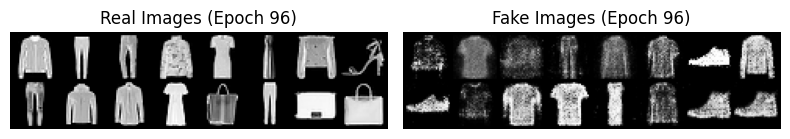

Epoch [97/200] Loss D: 0.5123, Loss G: 1.5758


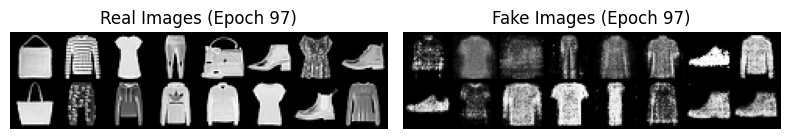

Epoch [98/200] Loss D: 0.3106, Loss G: 2.3301


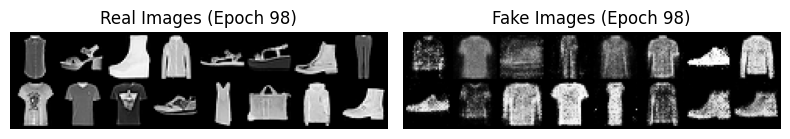

Epoch [99/200] Loss D: 0.3145, Loss G: 2.5618


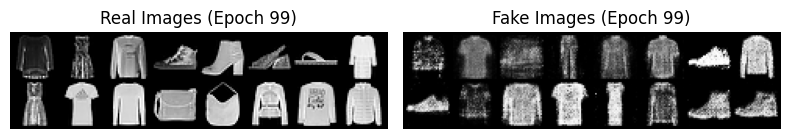

Epoch [100/200] Loss D: 0.3955, Loss G: 1.8878


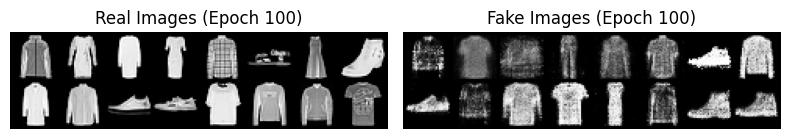

Epoch [101/200] Loss D: 0.4652, Loss G: 2.0008


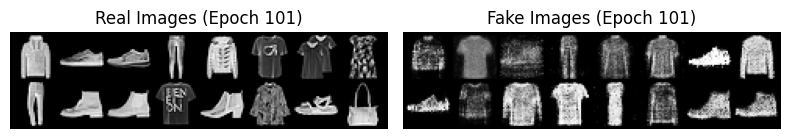

Epoch [102/200] Loss D: 0.5493, Loss G: 1.3193


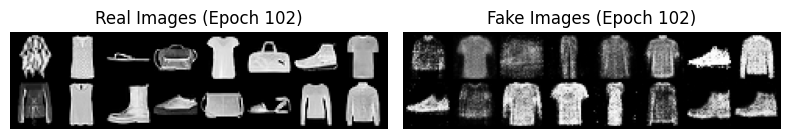

Epoch [103/200] Loss D: 0.5233, Loss G: 1.3923


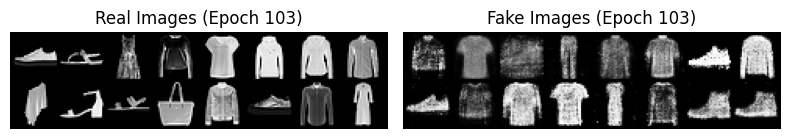

Epoch [104/200] Loss D: 0.5108, Loss G: 2.3644


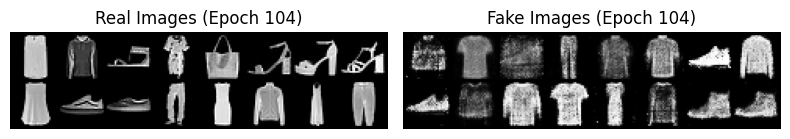

Epoch [105/200] Loss D: 0.4615, Loss G: 1.6470


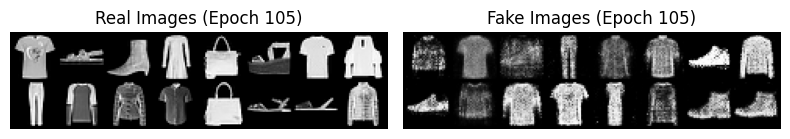

Epoch [106/200] Loss D: 0.4662, Loss G: 1.7207


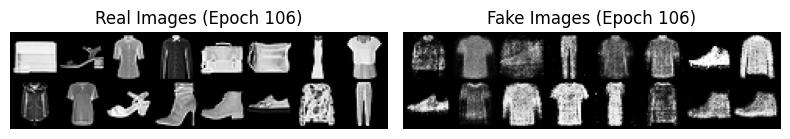

Epoch [107/200] Loss D: 0.5506, Loss G: 1.9677


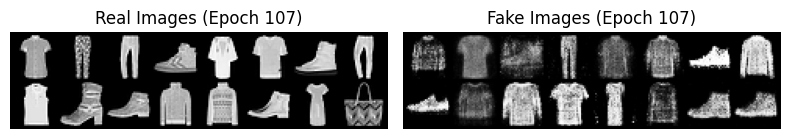

Epoch [108/200] Loss D: 0.5978, Loss G: 1.4121


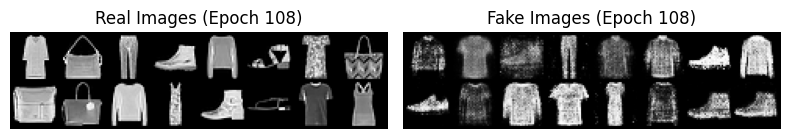

Epoch [109/200] Loss D: 0.5062, Loss G: 1.7574


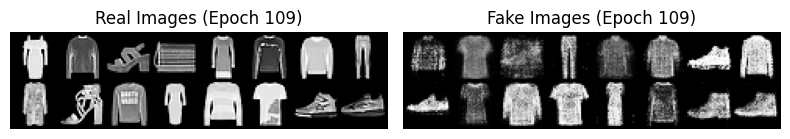

Epoch [110/200] Loss D: 0.2657, Loss G: 2.1477


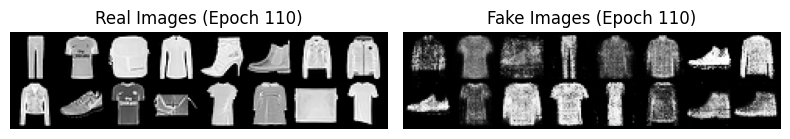

Epoch [111/200] Loss D: 0.3649, Loss G: 1.6632


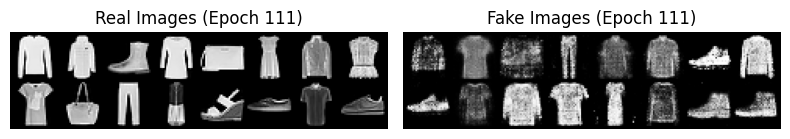

Epoch [112/200] Loss D: 0.4180, Loss G: 1.9273


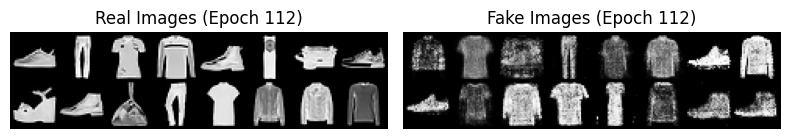

Epoch [113/200] Loss D: 0.4244, Loss G: 1.8415


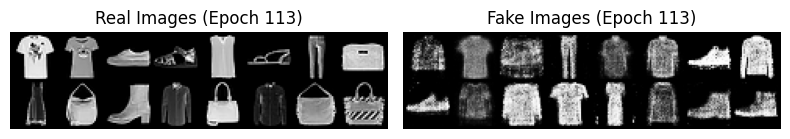

Epoch [114/200] Loss D: 0.5028, Loss G: 1.4327


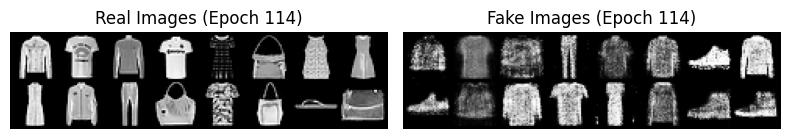

Epoch [115/200] Loss D: 0.4293, Loss G: 1.6086


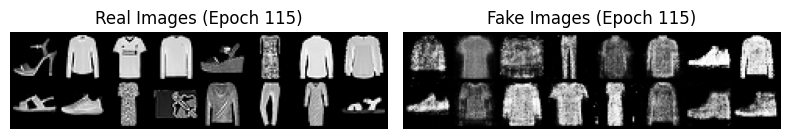

Epoch [116/200] Loss D: 0.4307, Loss G: 2.2804


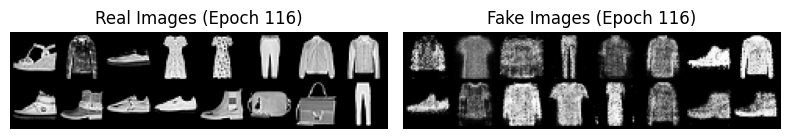

Epoch [117/200] Loss D: 0.4170, Loss G: 1.6519


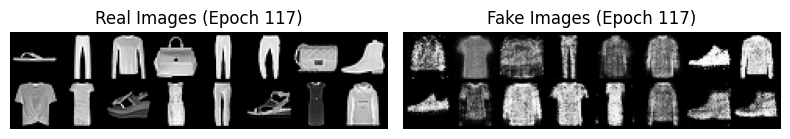

Epoch [118/200] Loss D: 0.5232, Loss G: 1.5147


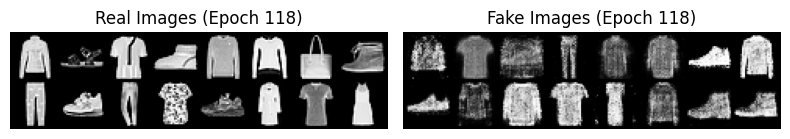

Epoch [119/200] Loss D: 0.3778, Loss G: 1.6780


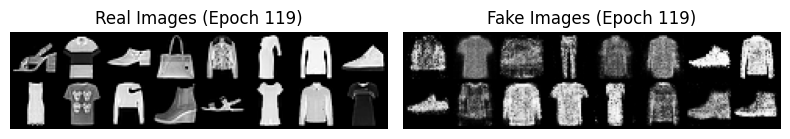

Epoch [120/200] Loss D: 0.4713, Loss G: 1.8493


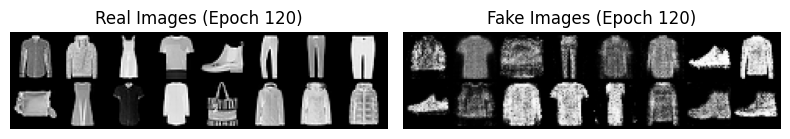

Epoch [121/200] Loss D: 0.4205, Loss G: 1.5382


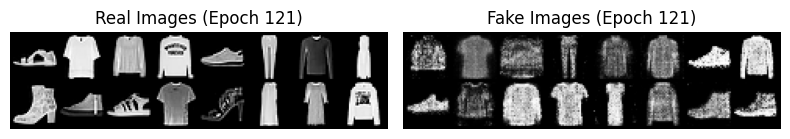

Epoch [122/200] Loss D: 0.5177, Loss G: 1.6213


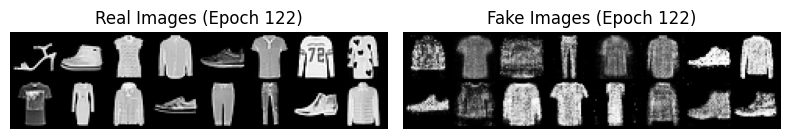

Epoch [123/200] Loss D: 0.3782, Loss G: 1.8253


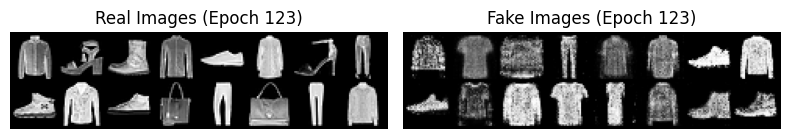

Epoch [124/200] Loss D: 0.4079, Loss G: 2.1736


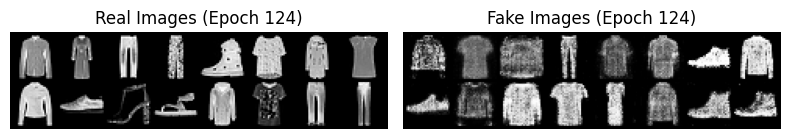

Epoch [125/200] Loss D: 0.4776, Loss G: 1.6210


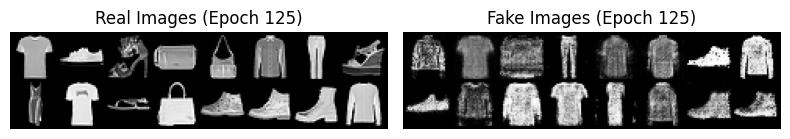

Epoch [126/200] Loss D: 0.5607, Loss G: 1.2072


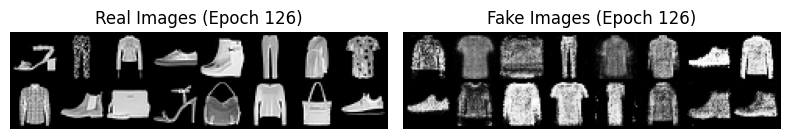

Epoch [127/200] Loss D: 0.4422, Loss G: 1.8839


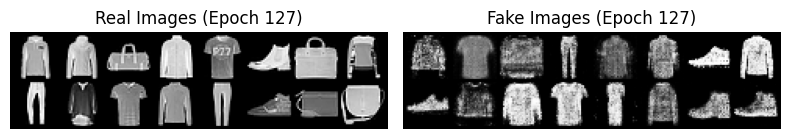

Epoch [128/200] Loss D: 0.3922, Loss G: 2.0625


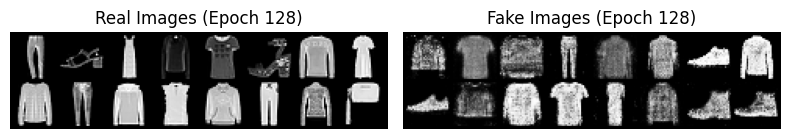

Epoch [129/200] Loss D: 0.4138, Loss G: 1.7807


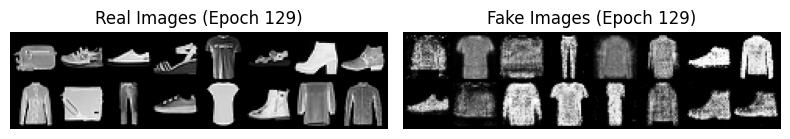

Epoch [130/200] Loss D: 0.3995, Loss G: 1.5130


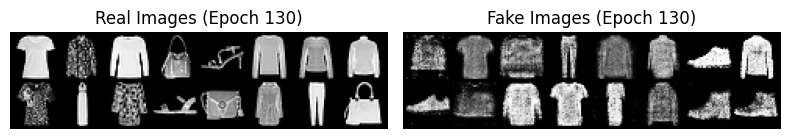

Epoch [131/200] Loss D: 0.4387, Loss G: 1.9278


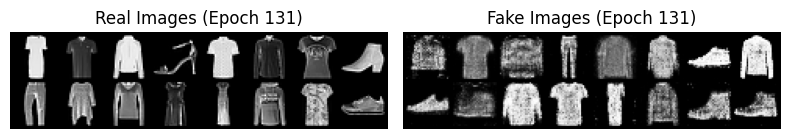

Epoch [132/200] Loss D: 0.3379, Loss G: 1.7943


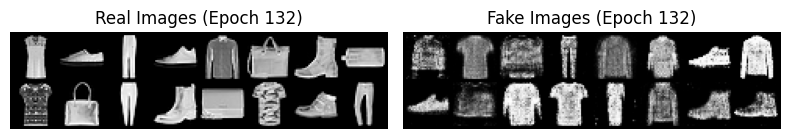

Epoch [133/200] Loss D: 0.5333, Loss G: 1.3016


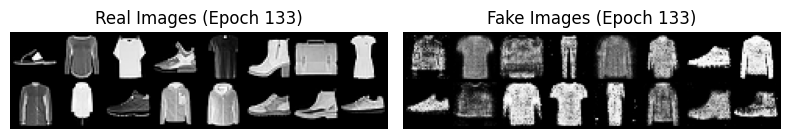

Epoch [134/200] Loss D: 0.4766, Loss G: 1.7053


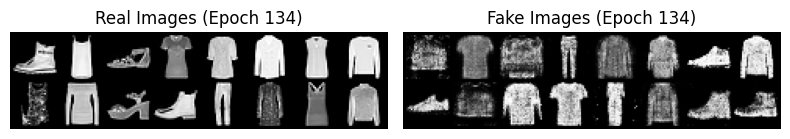

Epoch [135/200] Loss D: 0.3511, Loss G: 1.6452


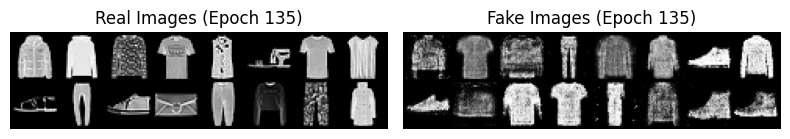

Epoch [136/200] Loss D: 0.3748, Loss G: 1.7499


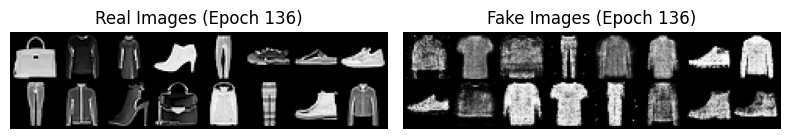

Epoch [137/200] Loss D: 0.4736, Loss G: 1.6698


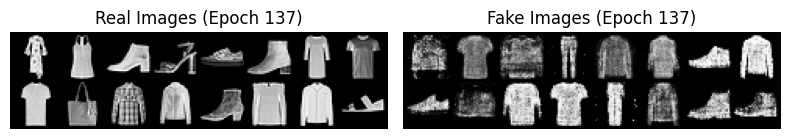

Epoch [138/200] Loss D: 0.3821, Loss G: 1.4621


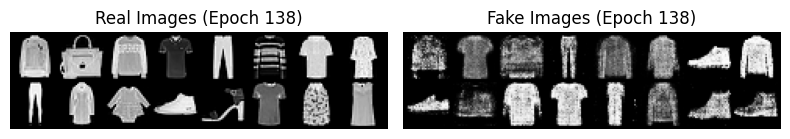

Epoch [139/200] Loss D: 0.5596, Loss G: 1.4466


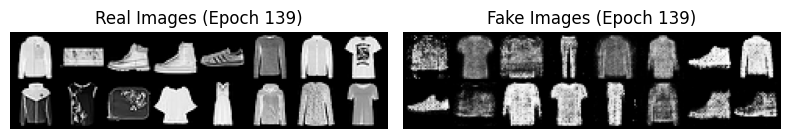

Epoch [140/200] Loss D: 0.4201, Loss G: 1.6535


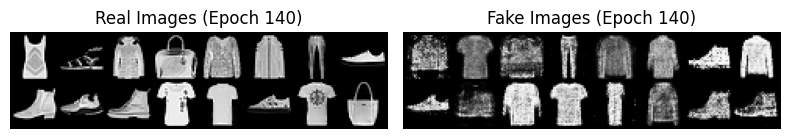

Epoch [141/200] Loss D: 0.6092, Loss G: 1.1514


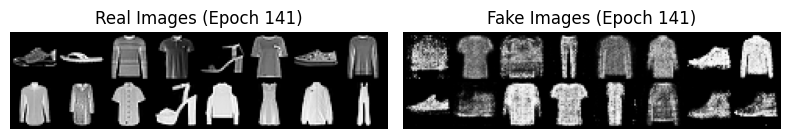

Epoch [142/200] Loss D: 0.3910, Loss G: 1.9134


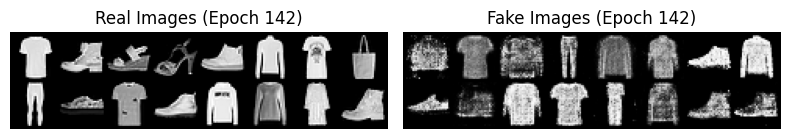

Epoch [143/200] Loss D: 0.4236, Loss G: 1.8020


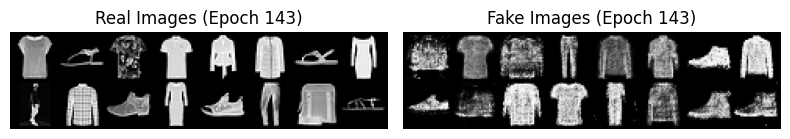

Epoch [144/200] Loss D: 0.5088, Loss G: 1.1461


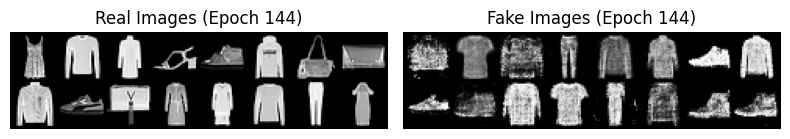

Epoch [145/200] Loss D: 0.3878, Loss G: 1.6142


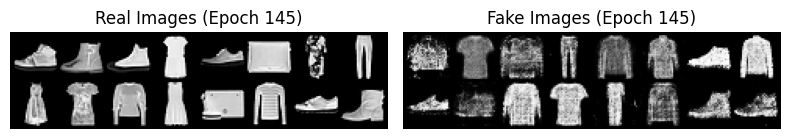

Epoch [146/200] Loss D: 0.5023, Loss G: 1.6123


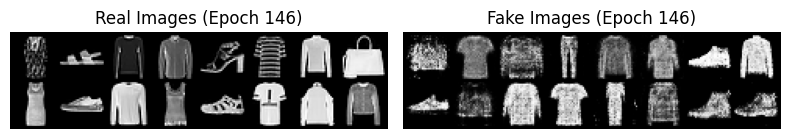

Epoch [147/200] Loss D: 0.4076, Loss G: 1.8743


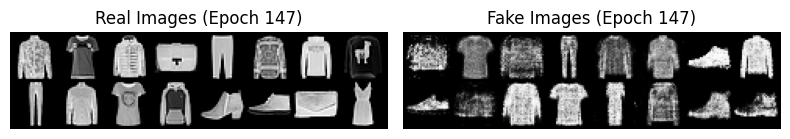

Epoch [148/200] Loss D: 0.5937, Loss G: 1.5030


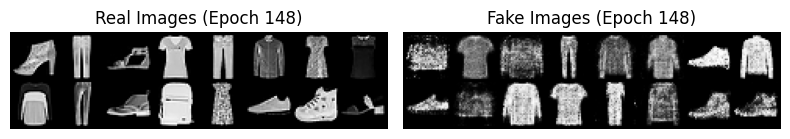

Epoch [149/200] Loss D: 0.3913, Loss G: 1.9487


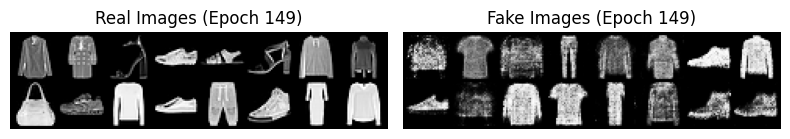

Epoch [150/200] Loss D: 0.5142, Loss G: 1.5785


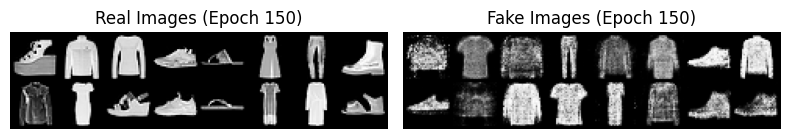

Epoch [151/200] Loss D: 0.5914, Loss G: 1.6583


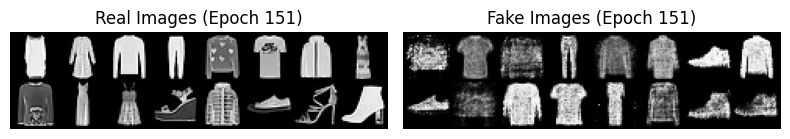

Epoch [152/200] Loss D: 0.4504, Loss G: 1.8327


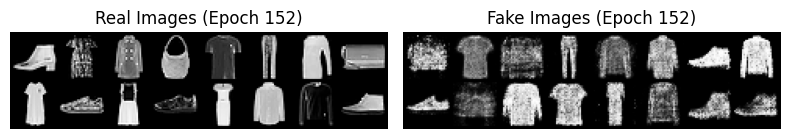

Epoch [153/200] Loss D: 0.5177, Loss G: 1.7313


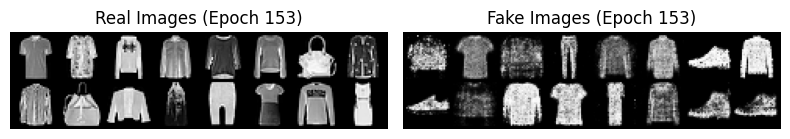

Epoch [154/200] Loss D: 0.4933, Loss G: 1.7199


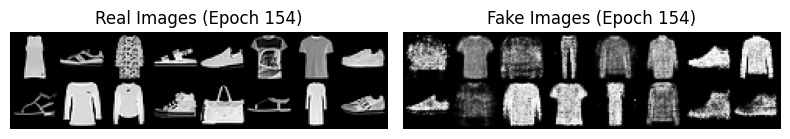

Epoch [155/200] Loss D: 0.4966, Loss G: 1.6737


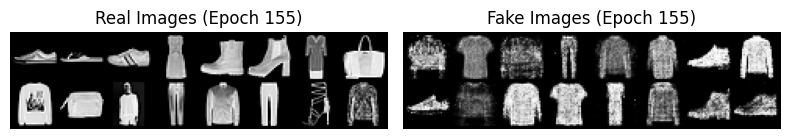

Epoch [156/200] Loss D: 0.5281, Loss G: 1.4531


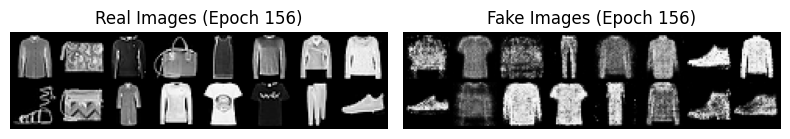

Epoch [157/200] Loss D: 0.6140, Loss G: 1.2987


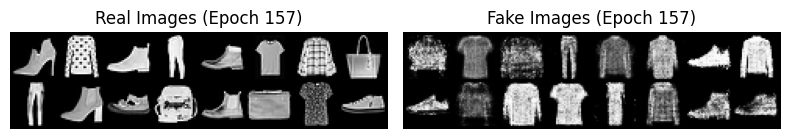

Epoch [158/200] Loss D: 0.4476, Loss G: 1.8199


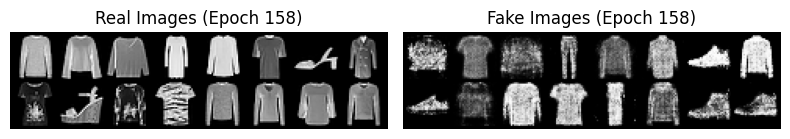

Epoch [159/200] Loss D: 0.4838, Loss G: 1.3999


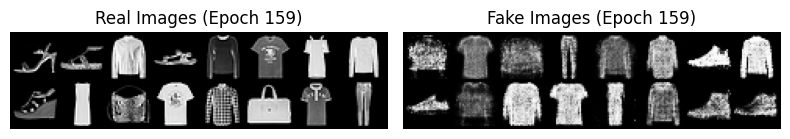

Epoch [160/200] Loss D: 0.5159, Loss G: 1.8084


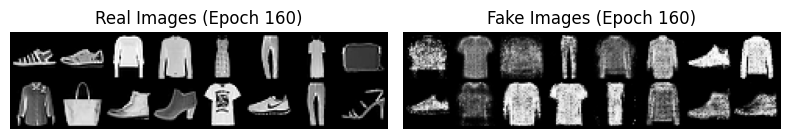

Epoch [161/200] Loss D: 0.6031, Loss G: 1.5478


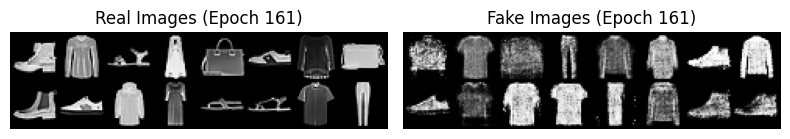

Epoch [162/200] Loss D: 0.5095, Loss G: 1.6155


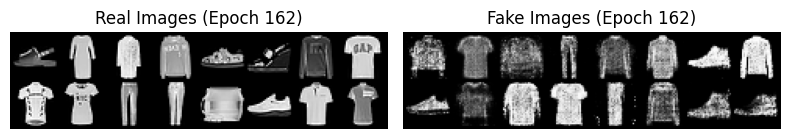

Epoch [163/200] Loss D: 0.3825, Loss G: 1.5654


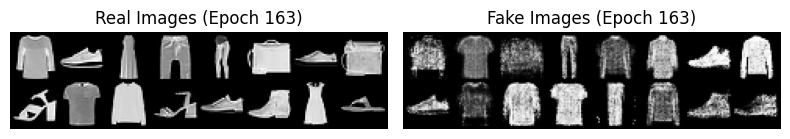

Epoch [164/200] Loss D: 0.3402, Loss G: 1.9284


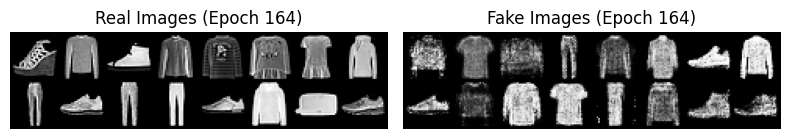

Epoch [165/200] Loss D: 0.5260, Loss G: 1.6464


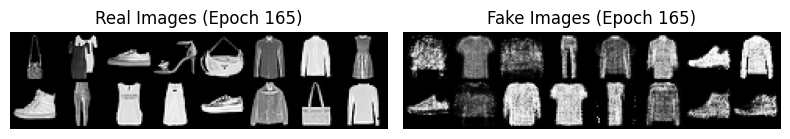

Epoch [166/200] Loss D: 0.2946, Loss G: 1.8778


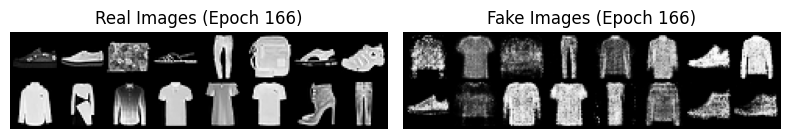

Epoch [167/200] Loss D: 0.4640, Loss G: 1.6360


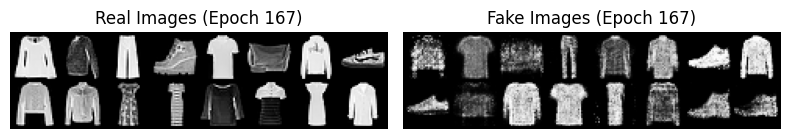

Epoch [168/200] Loss D: 0.3845, Loss G: 1.6445


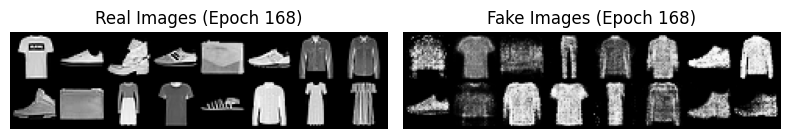

Epoch [169/200] Loss D: 0.3612, Loss G: 1.8976


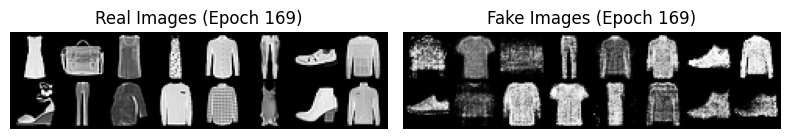

Epoch [170/200] Loss D: 0.5913, Loss G: 1.4550


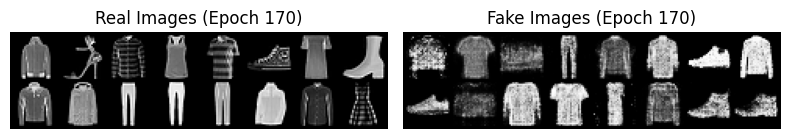

Epoch [171/200] Loss D: 0.5626, Loss G: 1.3705


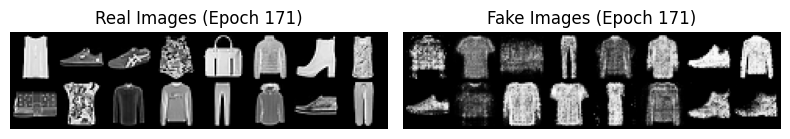

Epoch [172/200] Loss D: 0.4918, Loss G: 1.2514


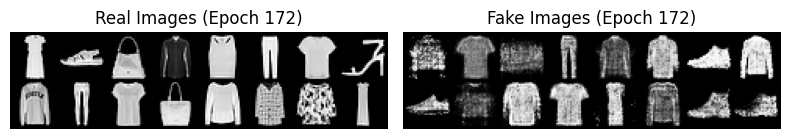

Epoch [173/200] Loss D: 0.4518, Loss G: 1.4573


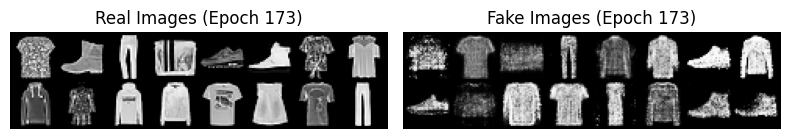

Epoch [174/200] Loss D: 0.4662, Loss G: 1.4345


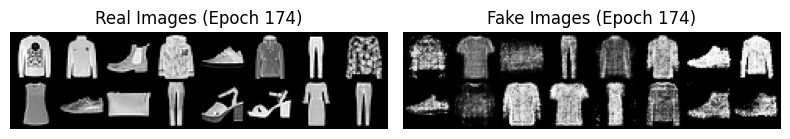

Epoch [175/200] Loss D: 0.4767, Loss G: 1.6501


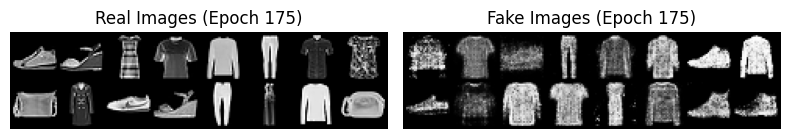

Epoch [176/200] Loss D: 0.5180, Loss G: 1.2082


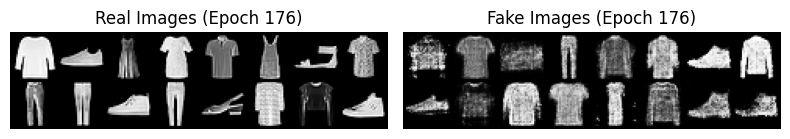

Epoch [177/200] Loss D: 0.5707, Loss G: 1.2858


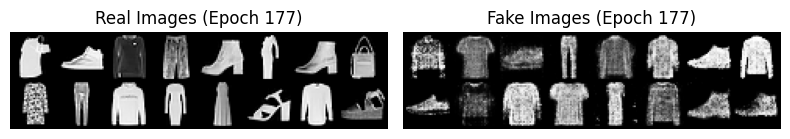

Epoch [178/200] Loss D: 0.4952, Loss G: 1.8127


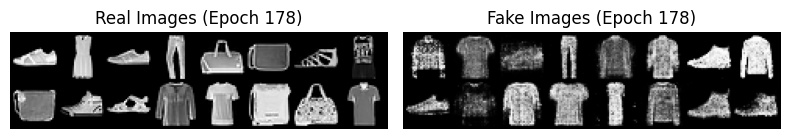

Epoch [179/200] Loss D: 0.3993, Loss G: 1.6168


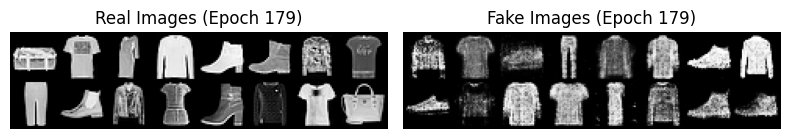

Epoch [180/200] Loss D: 0.3817, Loss G: 2.0831


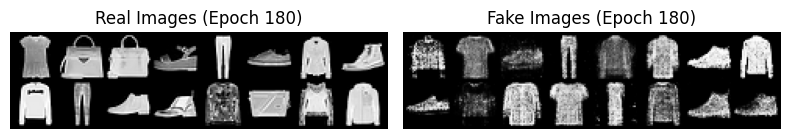

Epoch [181/200] Loss D: 0.4081, Loss G: 1.5873


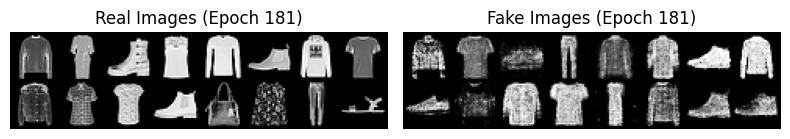

Epoch [182/200] Loss D: 0.3802, Loss G: 1.6313


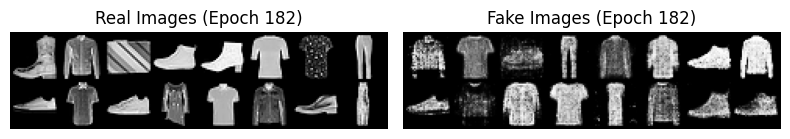

Epoch [183/200] Loss D: 0.3760, Loss G: 1.4323


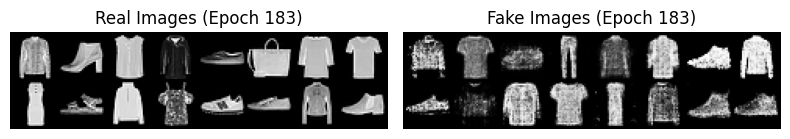

Epoch [184/200] Loss D: 0.4675, Loss G: 1.6504


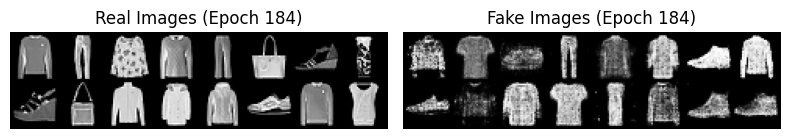

Epoch [185/200] Loss D: 0.3982, Loss G: 2.0965


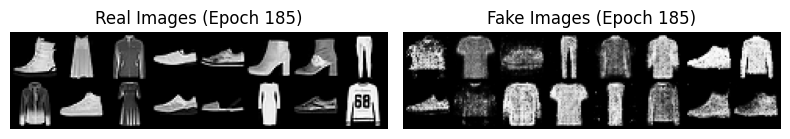

Epoch [186/200] Loss D: 0.3424, Loss G: 1.9656


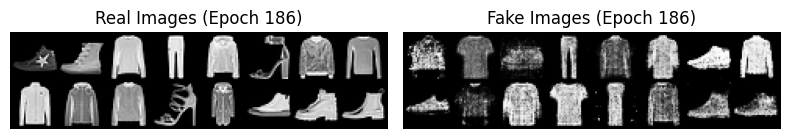

Epoch [187/200] Loss D: 0.3407, Loss G: 2.0524


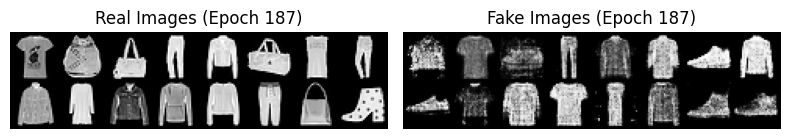

Epoch [188/200] Loss D: 0.4594, Loss G: 1.3937


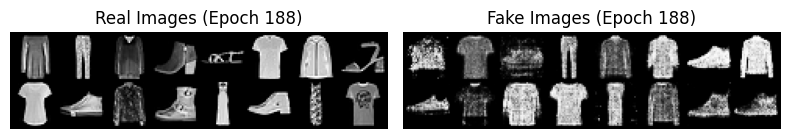

Epoch [189/200] Loss D: 0.5884, Loss G: 1.3450


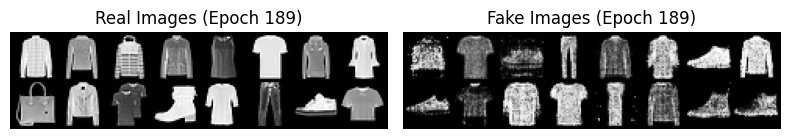

Epoch [190/200] Loss D: 0.4934, Loss G: 1.3489


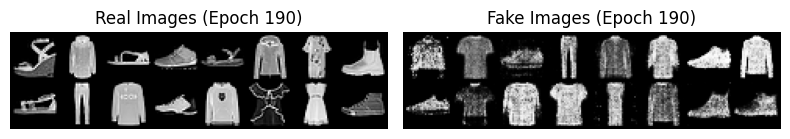

Epoch [191/200] Loss D: 0.5964, Loss G: 1.7039


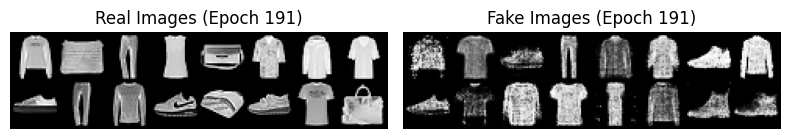

Epoch [192/200] Loss D: 0.4595, Loss G: 1.5306


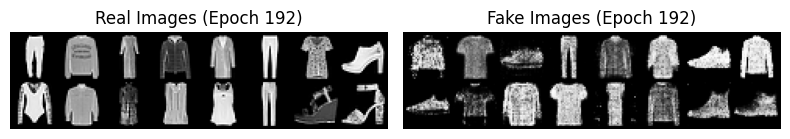

Epoch [193/200] Loss D: 0.4750, Loss G: 1.6521


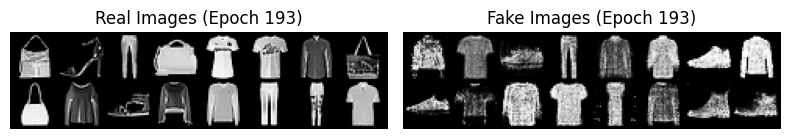

Epoch [194/200] Loss D: 0.3702, Loss G: 1.8395


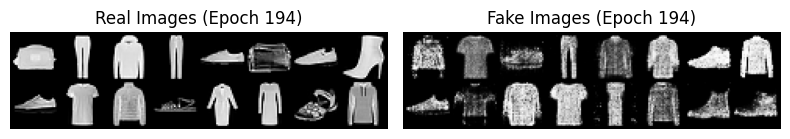

Epoch [195/200] Loss D: 0.4250, Loss G: 2.2960


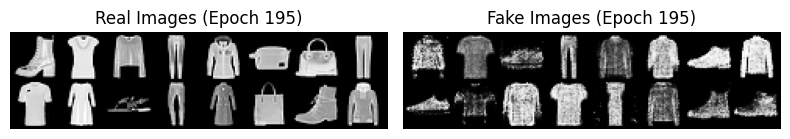

Epoch [196/200] Loss D: 0.3840, Loss G: 1.7766


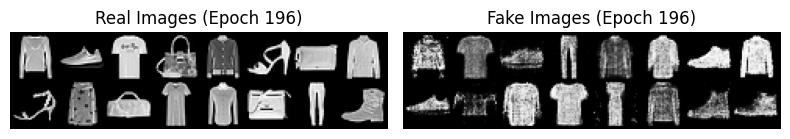

Epoch [197/200] Loss D: 0.4755, Loss G: 1.6380


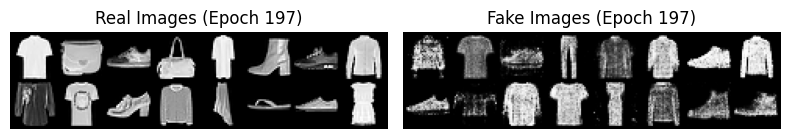

Epoch [198/200] Loss D: 0.3669, Loss G: 1.6248


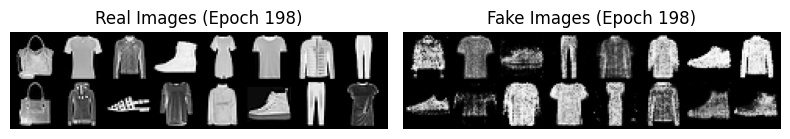

Epoch [199/200] Loss D: 0.4517, Loss G: 1.4253


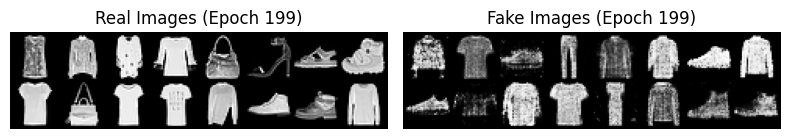

Epoch [200/200] Loss D: 0.5574, Loss G: 1.4600


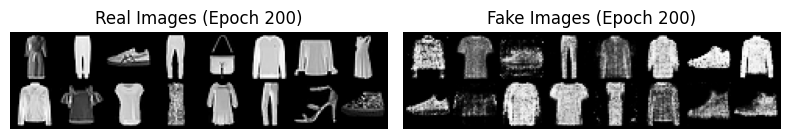

In [5]:
#Step 4: Training loop with visualization

#Check Loss Trends
# Keep track of losses for plotting later
losses_G = [] # generator losses over time
losses_D = [] # discriminator losses over time

# Main training loop
for epoch in range(epochs):
    for batch_idx, (real, _) in enumerate(dataloader):
        # Move real images to device
        real = real.to(device)
        bs = real.size(0)

        ### Train Discriminator
        # Generate fake images from random noise
        noise = torch.randn(bs, z_dim).to(device)
        fake = gen(noise)

        # Train the Discriminator on real and fake images
        disc_real = disc(real).view(-1) # Pass real images through discriminator
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))
        # Compare to "real" labels (1s) — we want the discriminator to output 1 for real images

        disc_fake = disc(fake.detach()).view(-1) # Pass generated (fake) images through discriminator
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        # Compare to "fake" labels (0s) — we want the discriminator to output 0 for fake images

        lossD = (lossD_real + lossD_fake) / 2 # Combine both losses for discriminator

        opt_disc.zero_grad() # Clear previous gradients
        lossD.backward() # Backpropagate the loss through discriminator
        opt_disc.step() # Update discriminator weights

        ### Train Generator
        output = disc(fake).view(-1) # Pass fake images through discriminator again
        lossG = criterion(output, torch.ones_like(output))
        # Generator tries to "fool" the discriminator, so we compare to real labels (1s)

        opt_gen.zero_grad() # Clear previous gradients
        lossG.backward() # Backpropagate through generator
        opt_gen.step() # Update generator weights


        # inside loop
        # Track the losses for later plotting
        losses_G.append(lossG.item()) # Save generator loss
        losses_D.append(lossD.item()) # Save discriminator loss

    # Print progress
    print(f"Epoch [{epoch+1}/{epochs}] Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}")

       # Visualization each epoch
    with torch.no_grad():
        fake_images = gen(fixed_noise).detach().cpu() # Generate a fixed set of images for comparison
    real_batch = next(iter(dataloader))[0][:16] # Get a batch of real images for side-by-side

    plt.figure(figsize=(8,4))

    # Real images
    plt.subplot(1,2,1)
    plt.axis("off")
    plt.title(f"Real Images (Epoch {epoch+1})")
    plt.imshow(np.transpose(
        vutils.make_grid(real_batch, padding=2, normalize=True),
        (1,2,0)
    ))

    # Fake images
    plt.subplot(1,2,2)
    plt.axis("off")
    plt.title(f"Fake Images (Epoch {epoch+1})")
    plt.imshow(np.transpose(
        vutils.make_grid(fake_images, padding=2, normalize=True),
        (1,2,0)
    ))

    plt.tight_layout()
    plt.show()


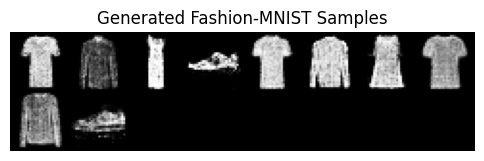

In [6]:
#Generate a fresh batch of fake images

import matplotlib.pyplot as plt
import torchvision.utils as vutils
import numpy as np
import torch

gen.eval() # Put the generator in evaluation mode (no gradient updates)

# generate 10 new samples
with torch.no_grad(): # Disable gradient tracking for inference
    test_noise = torch.randn(10, z_dim, device=device) # 10 random noise vectors
    fake_samples = gen(test_noise).cpu() # Generate images and move them to CPU for plotting

# # Visualize the generated samples
plt.figure(figsize=(6,6))
plt.axis("off")
plt.title("Generated Fashion-MNIST Samples")
plt.imshow(np.transpose(
    vutils.make_grid(fake_samples, padding=2, normalize=True),
    (1,2,0) # rearrange dimensions for matplotlib
))
plt.show()


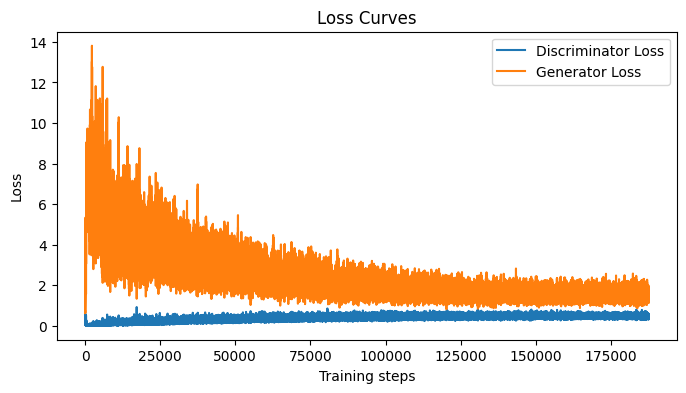

In [7]:
# Plot the loss curves after training

plt.figure(figsize=(8,4))
plt.plot(losses_D, label="Discriminator Loss") # Plot discriminator loss over time
plt.plot(losses_G, label="Generator Loss") # Plot generator loss over time
plt.xlabel("Training steps") # X-axis label
plt.ylabel("Loss") # Y-axis label
plt.legend() # Chart title
plt.title("Loss Curves") # Show legend for clarity
plt.show()
